# Credit Score Clasification

#### Importamos los datos

datos de https://www.kaggle.com/datasets/parisrohan/credit-score-classification

ID: Representa una identificación única de una entrada.

Customer_ID: Representa una identificación única de una persona.

Month: Representa el mes del año.

Name: Representa el nombre de la persona

Age: Representa la edad de la persona

SSN: Representa el número de seguro social de una persona.

Occupation: Representa la ocupación de la persona.

Annual_Income: Representa el ingreso anual de la persona.

Monthly_Inhand_Salary: Representa el salario base mensual de una persona.

Num_Bank_Accounts: Representa el número de cuentas bancarias que posee una persona.

Num_Credit_Card:Representa el número de otras tarjetas de crédito que posee una persona.

Interest_Rate: Representa la tasa de interés de la tarjeta de crédito.

Num_of_Loan: Representa el número de préstamos tomados del banco.

Type_of_Loan: Representa los tipos de préstamo tomados por una persona.

Delay_from_due_date: Representa el promedio de días de retraso desde la fecha de pago.

Num_of_Delayed_Payment: Representa el número promedio de pagos retrasados por una persona

Changed_Credit_Limit: Representa el cambio porcentual en el límite de la tarjeta de crédito.

Num_Credit_Inquiries: Representa el número de consultas de tarjetas de crédito.

Credit_Mix: Representa la clasificación del mix de créditos.

Outstanding_Debt: Representa la deuda restante por pagar (en USD).

Credit_Utilization_Ratio: Representa el índice de utilización de la tarjeta de crédito.

Credit_History_Age: Representa la antigüedad del historial crediticio de la persona.

Payment_of_Min_Amount: Represents whether only the minimum amount was paid by the person.

Total_EMI_per_month: Representa los pagos mensuales de EMI (en USD).

Amount_invested_monthly: Representa el monto mensual invertido por el cliente (en USD).

Payment_Behaviour: Representa el comportamiento de pago del cliente (en USD).

Monthly_Balance: Representa el saldo mensual del cliente (en USD).

Credit_Score: Representa el puntaje del crédito.

In [168]:
import numpy as np

def patch_asscalar(a):
    return a.item()

setattr(np, "asscalar", patch_asscalar)
import numpy as np
import kmapper as km
import sklearn
from sklearn import ensemble

In [169]:
import pandas as pd
df = pd.read_csv("Credit score classification.csv")

C:\Users\herie\AppData\Local\Temp\ipykernel_21296\2514519756.py:2: DtypeWarning: Columns (26) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv("Credit score classification.csv")


#### Limpiamos los datos

In [170]:
df.head(5)

,ID,Customer_ID,Month,Name,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,...,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score
0,0x1602,CUS_0xd40,January,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,1824.843333,3,...,_,809.98,26.822620,22 Years and 1 Months,No,49.574949,80.41529543900253,High_spent_Small_value_payments,312.49408867943663,Good
1,0x1603,CUS_0xd40,February,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,NaN,3,...,Good,809.98,31.944960,NaN,No,49.574949,118.28022162236736,Low_spent_Large_value_payments,284.62916249607184,Good
2,0x1604,CUS_0xd40,March,Aaron Maashoh,-500,821-00-0265,Scientist,19114.12,NaN,3,...,Good,809.98,28.609352,22 Years and 3 Months,No,49.574949,81.699521264648,Low_spent_Medium_value_payments,331.2098628537912,Good
3,0x1605,CUS_0xd40,April,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,NaN,3,...,Good,809.98,31.377862,22 Years and 4 Months,No,49.574949,199.4580743910713,Low_spent_Small_value_payments,223.45130972736786,Good
4,0x1606,CUS_0xd40,May,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,1824.843333,3,...,Good,809.98,24.797347,22 Years and 5 Months,No,49.574949,41.420153086217326,High_spent_Medium_value_payments,341.48923103222177,Good


Elegimos las columnas con las caracerísticas relevantes.

In [171]:
df.columns

Index(['ID', 'Customer_ID', 'Month', 'Name', 'Age', 'SSN', 'Occupation',
       'Annual_Income', 'Monthly_Inhand_Salary', 'Num_Bank_Accounts',
       'Num_Credit_Card', 'Interest_Rate', 'Num_of_Loan', 'Type_of_Loan',
       'Delay_from_due_date', 'Num_of_Delayed_Payment', 'Changed_Credit_Limit',
       'Num_Credit_Inquiries', 'Credit_Mix', 'Outstanding_Debt',
       'Credit_Utilization_Ratio', 'Credit_History_Age',
       'Payment_of_Min_Amount', 'Total_EMI_per_month',
       'Amount_invested_monthly', 'Payment_Behaviour', 'Monthly_Balance',
       'Credit_Score'],
      dtype='object')

In [172]:
feature_names = ["Age", "Monthly_Inhand_Salary", "Num_Bank_Accounts", "Delay_from_due_date", 
                 "Outstanding_Debt", "Amount_invested_monthly", "Monthly_Balance"]

Vemos el tipo de los datos

In [173]:
print(df[feature_names].dtypes)

Age                         object
Monthly_Inhand_Salary      float64
Num_Bank_Accounts            int64
Delay_from_due_date          int64
Outstanding_Debt            object
Amount_invested_monthly     object
Monthly_Balance             object
dtype: object


Los hacemos numéricos

In [174]:
df[feature_names] = df[feature_names].apply(pd.to_numeric, errors='coerce')
print(df[feature_names].dtypes)

Age                        float64
Monthly_Inhand_Salary      float64
Num_Bank_Accounts            int64
Delay_from_due_date          int64
Outstanding_Debt           float64
Amount_invested_monthly    float64
Monthly_Balance            float64
dtype: object


Vemos el tipo de los Credit_Score

In [175]:
print(df['Credit_Score'].unique())

['Good' 'Standard' 'Poor']


Les cambiamos el nombre para que sea más fácil leer

In [176]:
df['Credit_Score'] = df['Credit_Score'].replace({'Good': 'G', 'Standard': '-', 'Poor': 'P'})
print(df['Credit_Score'].unique())

['G' '-' 'P']


In [177]:
df = df.dropna()
df[feature_names].describe()

,Age,Monthly_Inhand_Salary,Num_Bank_Accounts,Delay_from_due_date,Outstanding_Debt,Amount_invested_monthly,Monthly_Balance
count,47631.000000,47631.000000,47631.000000,47631.000000,47631.000000,47631.000000,47631.000000
mean,111.135416,4027.954685,16.688879,21.950557,1507.077027,182.179158,382.536063
std,692.757769,3098.332577,114.580478,15.217623,1187.229356,176.936006,195.328776
min,-500.000000,303.645417,-1.000000,-5.000000,0.230000,0.000000,0.382558
25%,24.000000,1576.815417,4.000000,10.000000,606.470000,69.870952,264.712715
50%,33.000000,2993.830000,6.000000,19.000000,1240.480000,124.190339,325.391771
75%,42.000000,5720.074066,8.000000,29.000000,2130.220000,224.365733,444.533349
max,8697.000000,15204.633333,1798.000000,67.000000,4998.070000,1594.499454,1552.946094


Limpiamos los datos, por ejemplo, hay edades de -500 hasta 8698

In [178]:
df = df[(df['Age'] >= 20) & (df['Age'] <= 90)]
df = df[df['Num_Bank_Accounts'] >= 0]
df = df[df['Num_Bank_Accounts'] < 20]
df = df[df['Num_Credit_Card'] < 2000]

df[feature_names].describe()

,Age,Monthly_Inhand_Salary,Num_Bank_Accounts,Delay_from_due_date,Outstanding_Debt,Amount_invested_monthly,Monthly_Balance
count,40179.000000,40179.000000,40179.000000,40179.000000,40179.000000,40179.000000,40179.000000
mean,35.109709,4097.001919,5.417059,21.301700,1448.636294,184.974288,387.861545
std,9.451578,3138.011941,2.585683,14.976512,1165.295637,180.045428,197.782315
min,20.000000,303.645417,0.000000,-5.000000,0.230000,0.000000,0.382558
25%,27.000000,1602.939583,4.000000,10.000000,570.820000,70.589266,266.759394
50%,35.000000,3025.770000,6.000000,18.000000,1185.570000,125.413788,329.341829
75%,42.000000,5869.633333,7.000000,28.000000,2006.970000,227.797225,452.068750
max,56.000000,15204.633333,11.000000,67.000000,4998.070000,1594.499454,1468.313963


Estandarizamos

In [179]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
df[feature_names] = scaler.fit_transform(df[feature_names])

df[feature_names].describe()

,Age,Monthly_Inhand_Salary,Num_Bank_Accounts,Delay_from_due_date,Outstanding_Debt,Amount_invested_monthly,Monthly_Balance
count,4.017900e+04,4.017900e+04,4.017900e+04,4.017900e+04,4.017900e+04,4.017900e+04,4.017900e+04
mean,1.658800e-16,1.605746e-16,1.344017e-16,-5.305329e-17,2.688033e-17,-9.691068e-17,4.208894e-16
std,1.000012e+00,1.000012e+00,1.000012e+00,1.000012e+00,1.000012e+00,1.000012e+00,1.000012e+00
min,-1.598664e+00,-1.208856e+00,-2.095046e+00,-1.756219e+00,-1.242967e+00,-1.027388e+00,-1.959143e+00
25%,-8.580376e-01,-7.948005e-01,-5.480472e-01,-7.546377e-01,-7.533086e-01,-6.353199e-01,-6.123078e-01
50%,-1.160763e-02,-3.413770e-01,2.254525e-01,-2.204613e-01,-2.257535e-01,-3.308123e-01,-2.958831e-01
75%,7.290186e-01,5.648970e-01,6.122023e-01,4.472593e-01,4.791408e-01,2.378481e-01,3.246398e-01
max,2.210271e+00,3.539747e+00,2.159201e+00,3.051369e+00,3.045989e+00,7.828817e+00,5.462904e+00


Las cosas negativas las invertimos, por ejemplo, mientras mas cuentas de banco tengas peor es tu credit score

In [180]:
df['Num_Bank_Accounts'] = df['Num_Bank_Accounts'] * -1
df['Delay_from_due_date'] = df['Delay_from_due_date'] * -1
df['Outstanding_Debt'] = df['Outstanding_Debt'] * -1

df[feature_names].describe()

,Age,Monthly_Inhand_Salary,Num_Bank_Accounts,Delay_from_due_date,Outstanding_Debt,Amount_invested_monthly,Monthly_Balance
count,4.017900e+04,4.017900e+04,4.017900e+04,4.017900e+04,4.017900e+04,4.017900e+04,4.017900e+04
mean,1.658800e-16,1.605746e-16,-1.344017e-16,5.305329e-17,-2.688033e-17,-9.691068e-17,4.208894e-16
std,1.000012e+00,1.000012e+00,1.000012e+00,1.000012e+00,1.000012e+00,1.000012e+00,1.000012e+00
min,-1.598664e+00,-1.208856e+00,-2.159201e+00,-3.051369e+00,-3.045989e+00,-1.027388e+00,-1.959143e+00
25%,-8.580376e-01,-7.948005e-01,-6.122023e-01,-4.472593e-01,-4.791408e-01,-6.353199e-01,-6.123078e-01
50%,-1.160763e-02,-3.413770e-01,-2.254525e-01,2.204613e-01,2.257535e-01,-3.308123e-01,-2.958831e-01
75%,7.290186e-01,5.648970e-01,5.480472e-01,7.546377e-01,7.533086e-01,2.378481e-01,3.246398e-01
max,2.210271e+00,3.539747e+00,2.095046e+00,1.756219e+00,1.242967e+00,7.828817e+00,5.462904e+00


In [181]:
df[feature_names].describe()

,Age,Monthly_Inhand_Salary,Num_Bank_Accounts,Delay_from_due_date,Outstanding_Debt,Amount_invested_monthly,Monthly_Balance
count,4.017900e+04,4.017900e+04,4.017900e+04,4.017900e+04,4.017900e+04,4.017900e+04,4.017900e+04
mean,1.658800e-16,1.605746e-16,-1.344017e-16,5.305329e-17,-2.688033e-17,-9.691068e-17,4.208894e-16
std,1.000012e+00,1.000012e+00,1.000012e+00,1.000012e+00,1.000012e+00,1.000012e+00,1.000012e+00
min,-1.598664e+00,-1.208856e+00,-2.159201e+00,-3.051369e+00,-3.045989e+00,-1.027388e+00,-1.959143e+00
25%,-8.580376e-01,-7.948005e-01,-6.122023e-01,-4.472593e-01,-4.791408e-01,-6.353199e-01,-6.123078e-01
50%,-1.160763e-02,-3.413770e-01,-2.254525e-01,2.204613e-01,2.257535e-01,-3.308123e-01,-2.958831e-01
75%,7.290186e-01,5.648970e-01,5.480472e-01,7.546377e-01,7.533086e-01,2.378481e-01,3.246398e-01
max,2.210271e+00,3.539747e+00,2.095046e+00,1.756219e+00,1.242967e+00,7.828817e+00,5.462904e+00


# Visualizar datos

Visualizamos los datos

In [ ]:
import seaborn as sns
import os
import matplotlib.pyplot as plt

if not os.path.exists('Pairplot'):
    os.makedirs('Pairplot')

feature_names = ["Age", "Monthly_Inhand_Salary", "Num_Bank_Accounts", "Delay_from_due_date", 
                 "Outstanding_Debt", "Amount_invested_monthly", "Monthly_Balance", "Credit_Score"]


df['Credit_Score'] = df['Credit_Score'].replace({'G': 1, '-': 0, 'P': -1})
print(df['Credit_Score'].unique())

n=500
pairplot = sns.pairplot(df.sample(n)[feature_names], hue = 'Credit_Score', palette= 'viridis')
plt.savefig(f'Pairplot/pairplot{n}.png')

In [90]:
df['Credit_Score'].value_counts()

Credit_Score
-    20823
P    11735
G     6791
Name: count, dtype: int64

In [94]:
import numpy as np
import plotly.graph_objects as go
import plotly.io as py
import os

def create_3d_scatter(x_col, y_col, z_col):
    fig = go.Figure(data=[go.Scatter3d(
        x=df[x_col],
        y=df[y_col],
        z=df[z_col],
        mode='markers',
        marker=dict(
            size=3,
            color=df[z_col],
            colorscale='Viridis',   
            opacity=0.5
        ),
        text=df['Credit_Score'], 
        hoverinfo='text'  
    )])

    title = f'{x_col}, {y_col}, {z_col}'
    fig.update_layout(
        title=title,
        scene = dict(
            xaxis = dict(title = x_col, showbackground=False),
            yaxis = dict(title = y_col,showbackground=False),
            zaxis = dict(title = z_col,showbackground=False),
        ),
        margin=dict(l=0, r=0, b=0, t=0)
    )
    
    current_dir = os.getcwd()
    subfolder = '3D Scatter plot'
    filename = os.path.join(current_dir, subfolder, title.replace(' ', '_') + '.html')
    os.makedirs(os.path.dirname(filename), exist_ok=True)
    py.write_html(fig, filename)

    fig.show()

In [95]:
create_3d_scatter('Age', 'Monthly_Inhand_Salary', 'Outstanding_Debt')

Los puntos mas negativos son, personas de edad corta, que deben mucho, tienen poco salario base mensual :c y viceversa

# Mapper

## Ejemplo

Recordemos que faltan muchas variables.

In [97]:
eg = [c for c in df.columns if c in ['Num_Bank_Accounts', 'Delay_from_due_date', 'Outstanding_Debt']]

In [98]:
create_3d_scatter(eg[0], eg[1], eg[2])

In [36]:
X2 = np.array(df[eg])
y = np.array(df["Credit_Score"])

In [37]:
mapper = km.KeplerMapper(verbose=0)

#### DBSCAN

In [53]:
import os

eps = 1
min_samples = 5
n_cubes = 100
perc_overlap = 0.2

lens = mapper.fit_transform(X2, projection="l2norm")

graph = mapper.map(
    lens,
    X2,
    clusterer=sklearn.cluster.DBSCAN(eps=eps, min_samples=min_samples),
    cover=km.Cover(n_cubes=n_cubes, perc_overlap=perc_overlap),
)

current_dir = os.getcwd()
subfolder = 'Eg/DBSCAN'
filename = os.path.join(current_dir, subfolder, f"eps{eps},min_samples{min_samples},n_cubes{n_cubes},perc_overlap{perc_overlap}.html")
os.makedirs(os.path.dirname(filename), exist_ok=True)
mapper.visualize(graph,
                 path_html=filename,
                 custom_tooltips=y,
                 title=f"eps{eps},min_samples{min_samples},n_cubes{n_cubes},n_cubes{n_cubes},perc_overlap{perc_overlap}")

'<!DOCTYPE html>\n<html>\n\n<head>\n  <meta charset="utf-8">\n  <meta name="generator" content="KeplerMapper">\n  <title>eps1,min_samples5,n_cubes100,n_cubes100,perc_overlap0.2 | KeplerMapper</title>\n\n  <link rel="icon" type="image/png" href="http://i.imgur.com/axOG6GJ.jpg" />\n\n  <link href=\'https://fonts.googleapis.com/css?family=Roboto+Mono:700,300\' rel=\'stylesheet\' type=\'text/css\'>\n  <style>* {\n  margin: 0;\n  padding: 0;\n}\n\nhtml, body {\n  height: 100%;\n}\n\nbody {\n  font-family: "Roboto Mono", "Helvetica", sans-serif;\n  font-size: 14px;\n}\n\n#logo {\n  width:  85px;\n  height: 85px;\n}\n\n#display {\n  color: #95A5A6;\n  background: #212121;\n}\n\n#header {\n  background: #111111;\n}\n\n#print {\n  color: #000;\n  background: #FFF;\n}\n\nh1 {\n  font-size: 21px;\n  font-weight: 300;\n  font-weight: 300;\n}\n\nh2 {\n  font-size: 18px;\n  padding-bottom: 20px;\n  font-weight: 300;\n}\n\nh3 {\n  font-size: 14px;\n  font-weight: 700;\n  text-transform: uppercase;\n}

#### K Means

In [99]:
lens = mapper.fit_transform(X2)

n_clusters = 3
n_cubes = 100
perc_overlap = .05

graph = mapper.map(
    lens,
    X2,
    clusterer=sklearn.cluster.KMeans(n_clusters=n_clusters),
    cover=km.Cover(n_cubes=n_cubes, perc_overlap=perc_overlap),
)

current_dir = os.getcwd()
subfolder = 'Eg/K Means'
filename = os.path.join(current_dir, subfolder, f"n_clusters{n_clusters},n_cubes{n_cubes},perc_overlap{perc_overlap}.html")
os.makedirs(os.path.dirname(filename), exist_ok=True)
mapper.visualize(graph,
                 path_html=filename,
                 custom_tooltips=y,
                 title=f"n_clusters{n_clusters},n_cubes{n_cubes},n_cubes{n_cubes},perc_overlap{perc_overlap}")

'<!DOCTYPE html>\n<html>\n\n<head>\n  <meta charset="utf-8">\n  <meta name="generator" content="KeplerMapper">\n  <title>n_clusters3,n_cubes100,n_cubes100,perc_overlap0.05 | KeplerMapper</title>\n\n  <link rel="icon" type="image/png" href="http://i.imgur.com/axOG6GJ.jpg" />\n\n  <link href=\'https://fonts.googleapis.com/css?family=Roboto+Mono:700,300\' rel=\'stylesheet\' type=\'text/css\'>\n  <style>* {\n  margin: 0;\n  padding: 0;\n}\n\nhtml, body {\n  height: 100%;\n}\n\nbody {\n  font-family: "Roboto Mono", "Helvetica", sans-serif;\n  font-size: 14px;\n}\n\n#logo {\n  width:  85px;\n  height: 85px;\n}\n\n#display {\n  color: #95A5A6;\n  background: #212121;\n}\n\n#header {\n  background: #111111;\n}\n\n#print {\n  color: #000;\n  background: #FFF;\n}\n\nh1 {\n  font-size: 21px;\n  font-weight: 300;\n  font-weight: 300;\n}\n\nh2 {\n  font-size: 18px;\n  padding-bottom: 20px;\n  font-weight: 300;\n}\n\nh3 {\n  font-size: 14px;\n  font-weight: 700;\n  text-transform: uppercase;\n}\n\nh

Hay que acomodarlo para que haga sentido

## El bueno

In [30]:
import numpy as np

feature_names = ["Age", "Monthly_Inhand_Salary", "Num_Bank_Accounts", "Delay_from_due_date", 
                 "Outstanding_Debt", "Amount_invested_monthly", "Monthly_Balance"]


X = np.array(df[feature_names])
y = np.array(df["Credit_Score"])

In [20]:
mapper = km.KeplerMapper(verbose=0)

#### DBSCAN

In [22]:
import os

eps = 1.2
min_samples = 10
n_cubes = 100
perc_overlap = 0.3

lens = mapper.fit_transform(X)

graph = mapper.map(
    lens,
    X,
    clusterer=sklearn.cluster.DBSCAN(eps=eps, min_samples=min_samples),
    cover=km.Cover(n_cubes=n_cubes, perc_overlap=perc_overlap),
)

current_dir = os.getcwd()
subfolder = 'Credit Score Classification/DBSCAN'
filename = os.path.join(current_dir, subfolder, f"eps{eps},min_samples{min_samples},n_cubes{n_cubes},perc_overlap{perc_overlap}.html")
os.makedirs(os.path.dirname(filename), exist_ok=True)
mapper.visualize(graph,
                 path_html=filename,
                 custom_tooltips=y,
                 title=f"eps{eps},min_samples{min_samples},n_cubes{n_cubes},n_cubes{n_cubes},perc_overlap{perc_overlap}")

'<!DOCTYPE html>\n<html>\n\n<head>\n  <meta charset="utf-8">\n  <meta name="generator" content="KeplerMapper">\n  <title>eps1.2,min_samples10,n_cubes100,n_cubes100,perc_overlap0.3 | KeplerMapper</title>\n\n  <link rel="icon" type="image/png" href="http://i.imgur.com/axOG6GJ.jpg" />\n\n  <link href=\'https://fonts.googleapis.com/css?family=Roboto+Mono:700,300\' rel=\'stylesheet\' type=\'text/css\'>\n  <style>* {\n  margin: 0;\n  padding: 0;\n}\n\nhtml, body {\n  height: 100%;\n}\n\nbody {\n  font-family: "Roboto Mono", "Helvetica", sans-serif;\n  font-size: 14px;\n}\n\n#logo {\n  width:  85px;\n  height: 85px;\n}\n\n#display {\n  color: #95A5A6;\n  background: #212121;\n}\n\n#header {\n  background: #111111;\n}\n\n#print {\n  color: #000;\n  background: #FFF;\n}\n\nh1 {\n  font-size: 21px;\n  font-weight: 300;\n  font-weight: 300;\n}\n\nh2 {\n  font-size: 18px;\n  padding-bottom: 20px;\n  font-weight: 300;\n}\n\nh3 {\n  font-size: 14px;\n  font-weight: 700;\n  text-transform: uppercase;

#### K Means

In [23]:
lens = mapper.fit_transform(X)

n_clusters = 3
n_cubes = 100
perc_overlap = .1

graph = mapper.map(
    lens,
    X,
    clusterer=sklearn.cluster.KMeans(n_clusters=n_clusters, random_state=11),
    cover=km.Cover(n_cubes=n_cubes, perc_overlap=perc_overlap),
)

current_dir = os.getcwd()
subfolder = 'Credit Score Classification/K Means'
filename = os.path.join(current_dir, subfolder, f"n_clusters{n_clusters},n_cubes{n_cubes},perc_overlap{perc_overlap}.html")
os.makedirs(os.path.dirname(filename), exist_ok=True)
mapper.visualize(graph,
                 path_html=filename,
                 custom_tooltips=y,
                 title=f"n_clusters{n_clusters},n_cubes{n_cubes},n_cubes{n_cubes},perc_overlap{perc_overlap}")

'<!DOCTYPE html>\n<html>\n\n<head>\n  <meta charset="utf-8">\n  <meta name="generator" content="KeplerMapper">\n  <title>n_clusters3,n_cubes100,n_cubes100,perc_overlap0.1 | KeplerMapper</title>\n\n  <link rel="icon" type="image/png" href="http://i.imgur.com/axOG6GJ.jpg" />\n\n  <link href=\'https://fonts.googleapis.com/css?family=Roboto+Mono:700,300\' rel=\'stylesheet\' type=\'text/css\'>\n  <style>* {\n  margin: 0;\n  padding: 0;\n}\n\nhtml, body {\n  height: 100%;\n}\n\nbody {\n  font-family: "Roboto Mono", "Helvetica", sans-serif;\n  font-size: 14px;\n}\n\n#logo {\n  width:  85px;\n  height: 85px;\n}\n\n#display {\n  color: #95A5A6;\n  background: #212121;\n}\n\n#header {\n  background: #111111;\n}\n\n#print {\n  color: #000;\n  background: #FFF;\n}\n\nh1 {\n  font-size: 21px;\n  font-weight: 300;\n  font-weight: 300;\n}\n\nh2 {\n  font-size: 18px;\n  padding-bottom: 20px;\n  font-weight: 300;\n}\n\nh3 {\n  font-size: 14px;\n  font-weight: 700;\n  text-transform: uppercase;\n}\n\nh4

En ambos queda una línea, en un extremo están los que tienen un Good Credit Score y en otro están los que tienen un Poor Credit Score

# Homología

Vamos a ver las diferencias entre las homologías de los Good Credit Score y los Poor Credit Score.

In [182]:
from sklearn import datasets
import numpy as np
import matplotlib.pyplot as plt
from ripser import ripser
from persim import plot_diagrams
import matplotlib.pyplot as plt
plt.rcParams['text.usetex'] = False

Después de intentar varias veces, observé que el la mejor forma de hacer el analisis era si antes de empezar los separaba de una forma ordenada, si no me salian diferentes grupos con saltos muy bruscos en los diagramas de persistencia y los códigos de barras, en otras palabras, habían diversos grupos que se juntaban muy tarde, especialmente había problemas en el diagrama donde ambos se juntaban y resultaba que se tardaban más en juntar usuarios de Good Credit Score que lo que se tardaban en mezclar usuarios de Good Credit Score con usuarios de Poor Credit Score. Los ordené por suma porque en el mapper se obtuvieron resultados satisfactorios al usar esa proyección. Son grupos de 150 porque tambien se graficarán los diagramas y códigos de barras de ambos.

In [210]:
df['Total'] = df[feature_names].sum(axis=1)
feature_names.append('Total')
df = df.sort_values(by='Total', ascending=False)

feature_names.append('Credit_Score')

good = df[df['Credit_Score'] == 'G'].head(150)
poor = df[df['Credit_Score'] == 'P'].tail(150)
feature_names.remove('Total')

gap = pd.concat([good, poor]) # gap stands for Good and Poor or gap literally ajajja 😭👹

Vemos los datos ordenados:

In [184]:
good[feature_names].head(5)

,Age,Monthly_Inhand_Salary,Num_Bank_Accounts,Delay_from_due_date,Outstanding_Debt,Amount_invested_monthly,Monthly_Balance,Credit_Score
74708,2.210271,3.014321,2.095046,0.754638,0.910515,6.322710,-0.902904,G
94283,1.152234,3.302560,1.708297,1.355586,1.172280,6.251080,-0.748660,G
94285,1.152234,3.302560,1.708297,1.222042,1.172280,4.319825,1.059964,G
96162,0.729019,3.503563,2.095046,0.420777,1.173714,4.373043,1.345684,G
94282,1.152234,3.302560,1.708297,1.288814,1.172280,0.782765,4.077579,G


In [189]:
poor[feature_names].tail(5)

,Age,Monthly_Inhand_Salary,Num_Bank_Accounts,Delay_from_due_date,Outstanding_Debt,Amount_invested_monthly,Monthly_Balance,Credit_Score
56590,-1.387056,-0.989744,-0.998952,-2.517193,-3.021643,-0.513886,-0.787553,P
17603,-1.598664,-1.191771,-1.772452,-1.248524,-2.669582,-1.027388,-0.787416,P
486,-1.387056,-0.840628,-1.772452,-2.183333,-2.905697,-0.300701,-0.916179,P
60149,-1.175449,-0.991808,-1.772452,-2.517193,-2.646583,-0.551349,-0.699147,P
481,-1.492860,-0.840628,-1.772452,-2.183333,-2.905697,-0.827871,-0.486845,P


Nos hacemos una idea de los datos:

In [186]:
good[feature_names].describe()

,Age,Monthly_Inhand_Salary,Num_Bank_Accounts,Delay_from_due_date,Outstanding_Debt,Amount_invested_monthly,Monthly_Balance
count,150.000000,150.000000,150.000000,150.000000,150.000000,150.000000,150.000000
mean,1.041492,3.031166,1.460777,0.963857,0.740362,2.543074,1.999259
std,0.836280,0.358290,0.567272,0.333247,0.356674,2.061103,1.865199
min,-0.963841,2.094500,0.161297,0.153689,-0.019252,-0.506884,-1.814421
25%,0.649666,2.907567,0.934797,0.687866,0.559446,0.662607,0.404254
50%,1.258037,3.101959,1.708297,1.021726,0.804785,2.252373,2.344899
75%,1.681252,3.272428,2.095046,1.222042,1.047263,4.274521,3.526993
max,2.210271,3.518098,2.095046,1.689446,1.232309,7.828817,5.440042


Recordemos que estandarizamos los datos para no ponerle más importancia al total de dinero invertido, por ejemplo, sobre el numero de cuentas de banco que tiene un usuario.

In [187]:
poor[feature_names].describe()

,Age,Monthly_Inhand_Salary,Num_Bank_Accounts,Delay_from_due_date,Outstanding_Debt,Amount_invested_monthly,Monthly_Balance
count,150.000000,150.000000,150.000000,150.000000,150.000000,150.000000,150.000000
mean,-1.096449,-0.954129,-1.336714,-2.148611,-2.333258,-0.643222,-0.650950
std,0.511206,0.124294,0.503556,0.503894,0.705741,0.232000,0.179023
min,-1.598664,-1.191771,-1.772452,-3.051369,-3.021643,-1.027388,-1.303225
25%,-1.492860,-1.062623,-1.772452,-2.517193,-2.835008,-0.827693,-0.735816
50%,-1.281253,-0.960263,-1.385702,-2.250105,-2.635577,-0.689001,-0.624178
75%,-0.858038,-0.861079,-0.998952,-1.983016,-2.139742,-0.494661,-0.522362
max,0.729019,-0.563042,-0.225452,-0.514031,-0.556255,0.049444,-0.275489


Podemos ver que la media de todos los datos es negativa, algo que les otorga mayores probabilidades de tener un Poor Credit Score por como fueron construidos los datos.

In [188]:
gap[feature_names].describe()

,Age,Monthly_Inhand_Salary,Num_Bank_Accounts,Delay_from_due_date,Outstanding_Debt,Amount_invested_monthly,Monthly_Balance
count,300.000000,300.000000,300.000000,300.000000,300.000000,300.000000,300.000000
mean,-0.027478,1.038519,0.062032,-0.592377,-0.796448,0.949926,0.674155
std,1.274857,2.013851,1.499918,1.616117,1.637462,2.165733,1.873876
min,-1.598664,-1.191771,-1.772452,-3.051369,-3.021643,-1.027388,-1.814421
25%,-1.281253,-0.956852,-1.385702,-2.250105,-2.630075,-0.685661,-0.675310
50%,-0.434823,0.765729,-0.032078,-0.180171,-0.287753,-0.197106,-0.454458
75%,1.258037,3.101959,1.708297,1.021726,0.802732,2.232123,2.341279
max,2.210271,3.518098,2.095046,1.689446,1.232309,7.828817,5.440042


Borramos Credit_Score para poder hacer el análisis.

In [211]:
feature_names.remove('Credit_Score')

### Código de barras

Graficamos los códigos de barras de los 3 grupos, los Good Credit Score, los Poor Credit Score y los Good and Poor Credit Score. Cuando una barra llega a 1.25 veces más que la anterior, es porque esa barra es infinita. La filtración se hace con Vietorius Rips.

In [206]:
from ripser import ripser
import matplotlib.pyplot as plt
import numpy as np

def barcode_homology_persistence(data, title, dimension):
    result = ripser(data, maxdim=dimension)
    diagrams = result['dgms']
    plt.figure(figsize=(10, 10))
    plt.suptitle(title)
    dgm = diagrams[dimension]
    for j, pt in enumerate(dgm):
        death = pt[1] if np.isfinite(pt[1]) else np.max(dgm[np.isfinite(dgm[:, 1]), 1]) * 1.25
        plt.plot([pt[0], death], [j, j], '-o')  
    plt.tight_layout()
    plt.show()

Luego de hacer la función, graficamos.

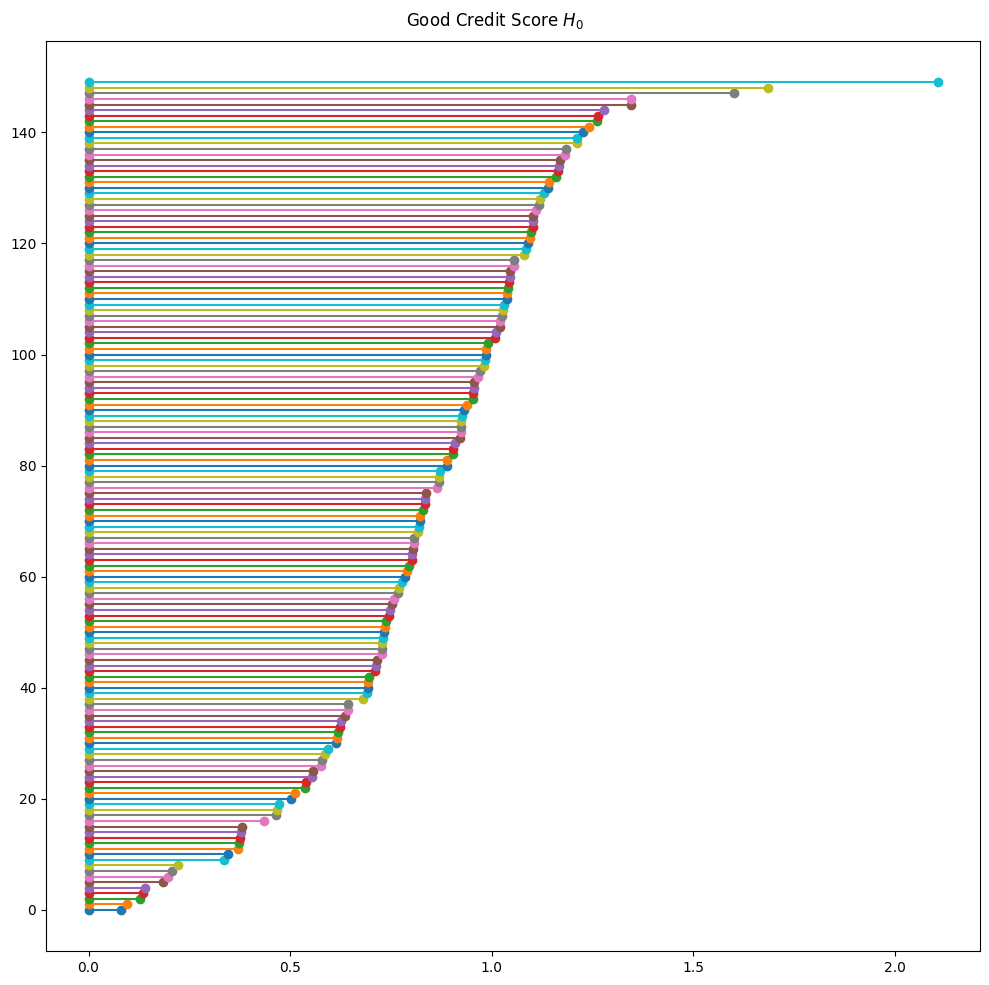

In [212]:
barcode_homology_persistence(good[feature_names], 'Good Credit Score $H_0$', 0)

Vemos que hay principalmente 3 grupos de usuarios con Good Credit Score. Además, es curioso ver que junto con el mapper, se observa que los dos grupos que se encuentran después del 1.2, sin contar la componente principal, son los mismos grupos que en el mapper se encuentran disconexos. En el mapper se usó el método de clustering de DBSCAN y los eps fueron de 1.2.

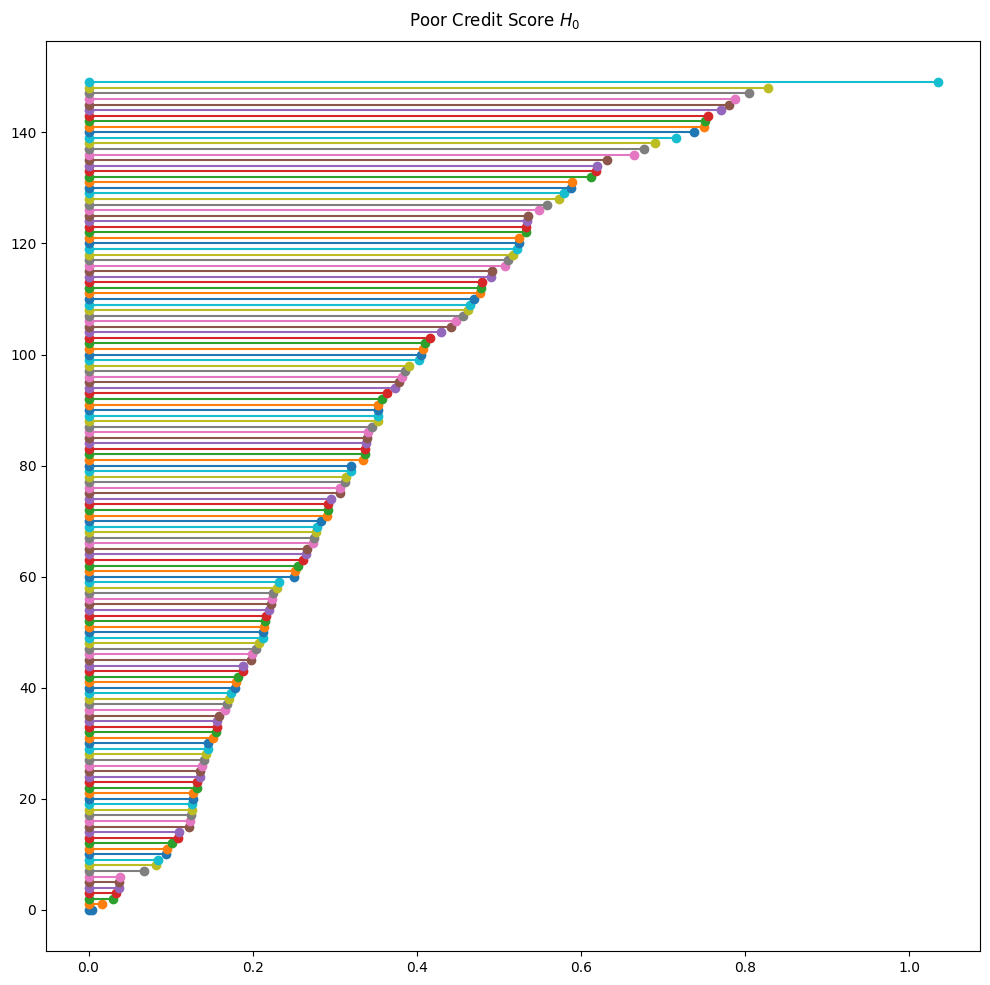

In [209]:
barcode_homology_persistence(poor[feature_names], 'Poor Credit Score $H_0$', 0)

En Poor Credit Score hay más grupos, pero se juntan mucho antes, indicando que las diferencias entre usuarios de este grupo son menores, casi la mitad (al agarrar la muerte del último grupo) comparadas con los usuarios de Good Credit Score.

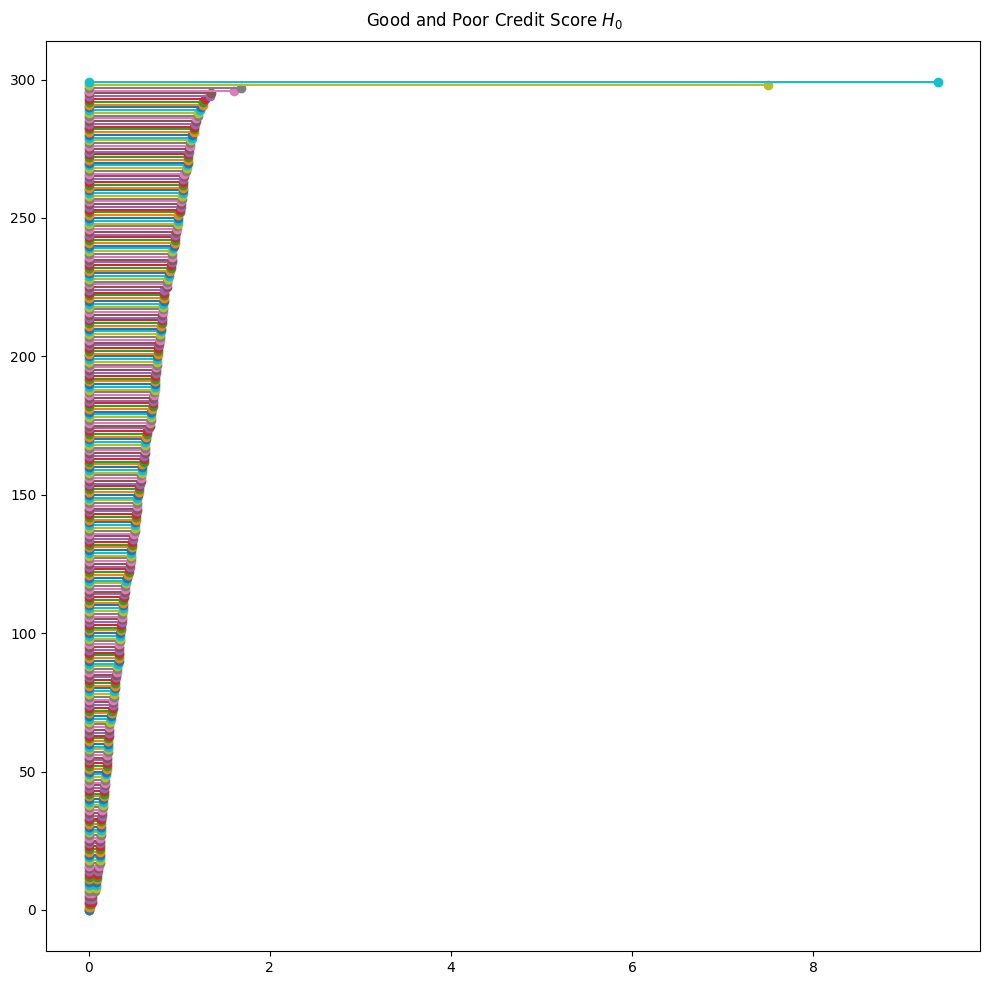

In [213]:
barcode_homology_persistence(gap[feature_names], 'Good and Poor Credit Score $H_0$', 0)

El diagrama nos muestra que hay principalmente dos grupos, el de Good Credit Score y el de Poor Credit Score.
(Cuandose escogieron los datos aleatoriamente, parecían que los grupos más distintos siguien siendo dos de Good Credit Score, indicando que las diferencias entre Good Credit Score y Poor Credit Score son inferiores a la de los dos grupos de Good Credit Score. Hay que recordar que solo seleccionamos 150 datos, si seleccionaramos todos los datos tendríamos un mejor análisis.)

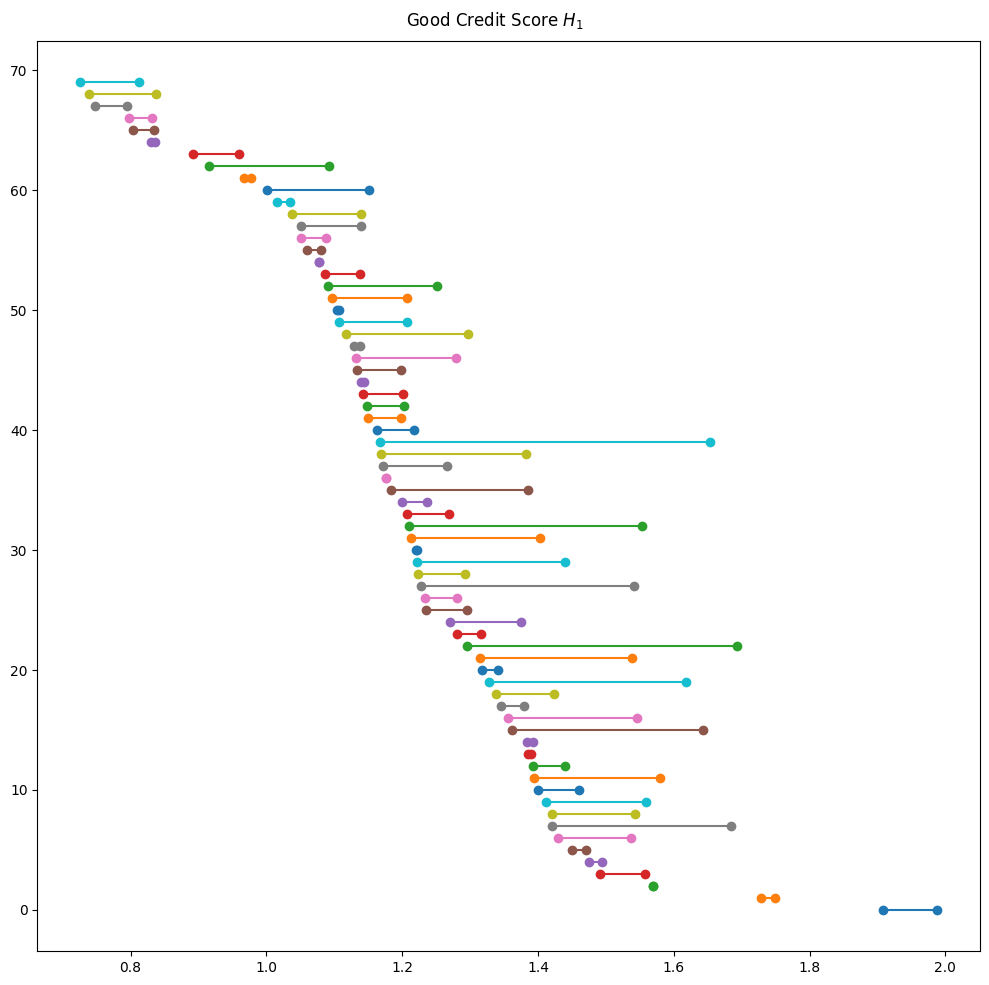

In [214]:
barcode_homology_persistence(good[feature_names], 'Good Credit Score $H_1$', 1)

Se observa que hay muchas características duraderas en $H_1$ de Good Credit Score. 

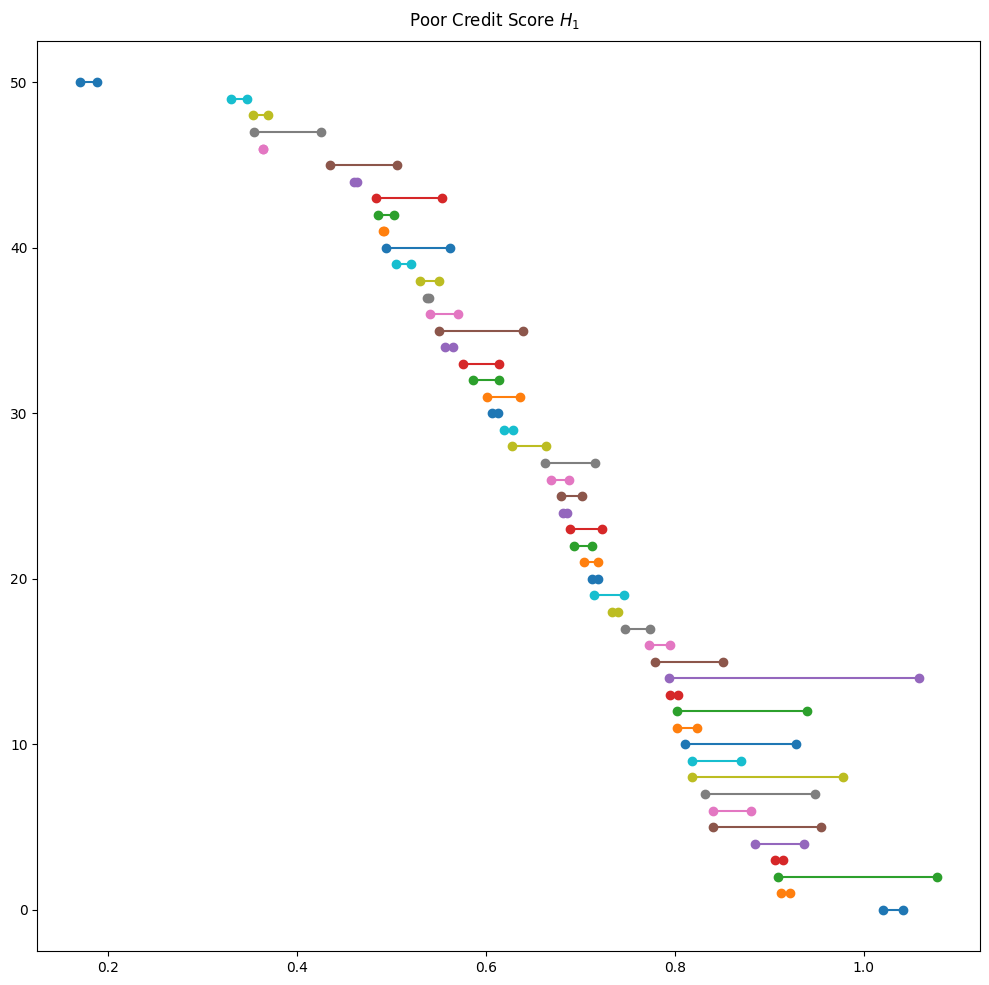

In [215]:
barcode_homology_persistence(poor[feature_names], 'Poor Credit Score $H_1$', 1)

Se observa que al final empiezan a haber características duraderas en $H_1$ de Poor Credit Score. También se observa que los huecos de dimensión 1 de Poor Credit Score desaparecen cuando los de Good Credit Score empiezan a aparecer, indicando que los datos de Good Credit Score están más dispersos. 

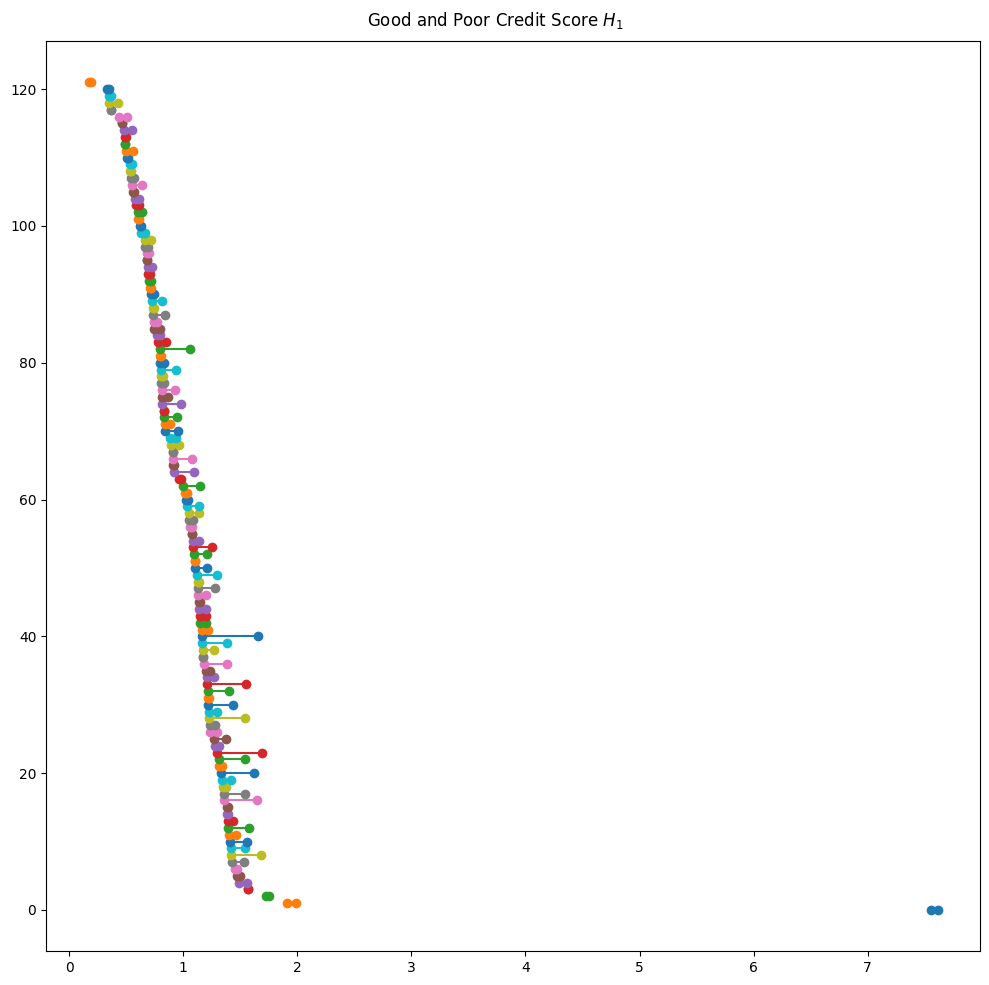

In [238]:
barcode_homology_persistence(gap[feature_names], 'Good and Poor Credit Score $H_1$', 1)

Parece que no hay caracteristicas relevantes en $H_1$ de Good and Poor Credit Score, sin embargo, hay que recordar que Good Credit Score y Poor Credit Score se juntan al llegar a solo se llega a casi 8, haciendo parecer las demas distancias cortas, entonces se puede decir que las barras de vida emipezan a ser mas largas al final. Ademas, se observa que se forma un hueco de dimensión 1 cuando Good Credit Score y Poor Credit Score se juntan.

### Diagrama de persistencia

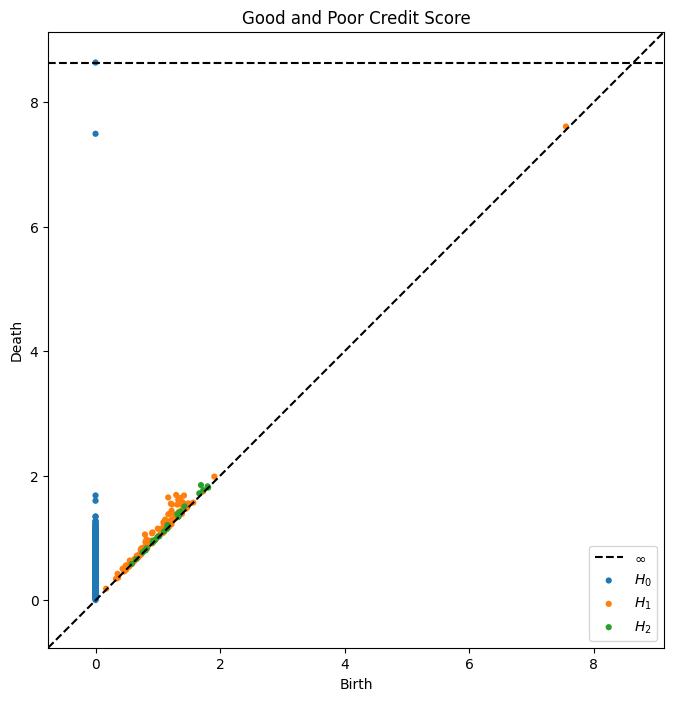

In [217]:
diagram_gandp = ripser(gap[feature_names], maxdim=2)['dgms']
plt.figure(figsize=(8, 8)) 
plot_diagrams(diagram_gandp, show=True, title="Good and Poor Credit Score")

Se muestra lo mismo que en el código de barras de una manera más sencilla de visualizar para muchos datos, donde los grupos que más tardan en juntarse son los Good Credit Score y los Poor Credit Score.

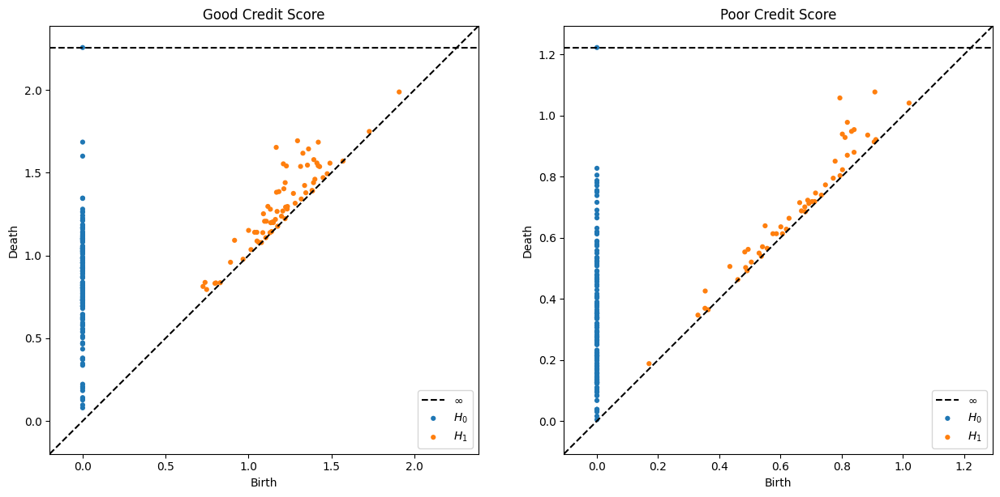

In [218]:
diagram_good = ripser(good[feature_names], maxdim=1)['dgms']
diagram_poor = ripser(poor[feature_names], maxdim=1)['dgms']

plt.figure(figsize=(15, 7)) 
plot_diagrams(diagram_good, ax=plt.subplot(121), title="Good Credit Score")
plot_diagrams(diagram_poor, ax=plt.subplot(122), title="Poor Credit Score")

Al analizarlos uno por uno, se vuelve a observar que las diferencias entre los usuarios de Good Credit Score es mayor a la diferencia que tienen los usuarios de Poor Credit Score.

### Distanca de Cuello de Botella en $H_0$

c:\Users\herie\AppData\Local\Programs\Python\Python312\Lib\site-packages\persim\bottleneck.py:55: UserWarning: dgm1 has points with non-finite death times;ignoring those points
  warnings.warn(
c:\Users\herie\AppData\Local\Programs\Python\Python312\Lib\site-packages\persim\bottleneck.py:64: UserWarning: dgm2 has points with non-finite death times;ignoring those points
  warnings.warn(


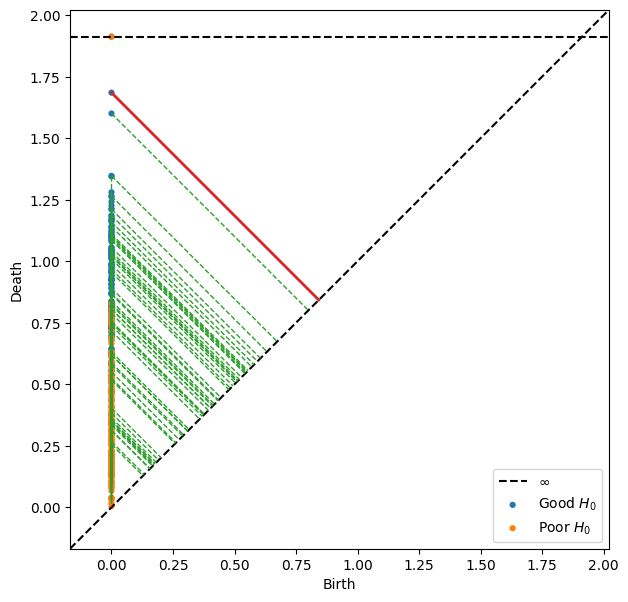

c:\Users\herie\AppData\Local\Programs\Python\Python312\Lib\site-packages\persim\bottleneck.py:55: UserWarning: dgm1 has points with non-finite death times;ignoring those points
  warnings.warn(
c:\Users\herie\AppData\Local\Programs\Python\Python312\Lib\site-packages\persim\bottleneck.py:64: UserWarning: dgm2 has points with non-finite death times;ignoring those points
  warnings.warn(


0.8424588441848755

In [220]:
good_H0 = ripser(good[feature_names])['dgms'][0]
poor_H0 = ripser(poor[feature_names])['dgms'][0]

import persim

distance_bottleneck, matching = persim.bottleneck(good_H0, poor_H0, matching=True)

plt.figure(figsize=(15, 7)) 
persim.bottleneck_matching(good_H0, poor_H0, matching, labels=['Good $H_0$', 'Poor $H_0$'])
plt.show()

persim.bottleneck(good_H0, poor_H0)

La distancia de q-Wasserstein es de 0.8424588441848755, muy alta para el rango de nuestros datos, indicando que hay diferencias topológicas importantees en $H_0$ entre los usuarios que tienen Good Credit Score y los usuarios que tienen Poor Credit Score. 

Durante mi ensayo de aplicaciones del ATD a econonmía, observé que muchos hacian un diagrama de distancias de cuello de botella para la inferencia de datos, como los tengo ordenados, pensé en hacer el diagrama de distancias de cuello de botella donde se media la distancia del bloque de los grupos con valores más altos con el bloque de los grupos con valores más bajos, esperando que la distancia fuera disminuyendo, pero no fue el caso, supongo que no aplica para este tipo de datos.

c:\Users\herie\AppData\Local\Programs\Python\Python312\Lib\site-packages\ripser\ripser.py:253: UserWarning: The input point cloud has more columns than rows; did you mean to transpose?
  warnings.warn(
c:\Users\herie\AppData\Local\Programs\Python\Python312\Lib\site-packages\ripser\ripser.py:253: UserWarning: The input point cloud has more columns than rows; did you mean to transpose?
  warnings.warn(
c:\Users\herie\AppData\Local\Programs\Python\Python312\Lib\site-packages\persim\bottleneck.py:55: UserWarning: dgm1 has points with non-finite death times;ignoring those points
  warnings.warn(
c:\Users\herie\AppData\Local\Programs\Python\Python312\Lib\site-packages\persim\bottleneck.py:64: UserWarning: dgm2 has points with non-finite death times;ignoring those points
  warnings.warn(
c:\Users\herie\AppData\Local\Programs\Python\Python312\Lib\site-packages\ripser\ripser.py:253: UserWarning: The input point cloud has more columns than rows; did you mean to transpose?
  warnings.warn(
c:\Use

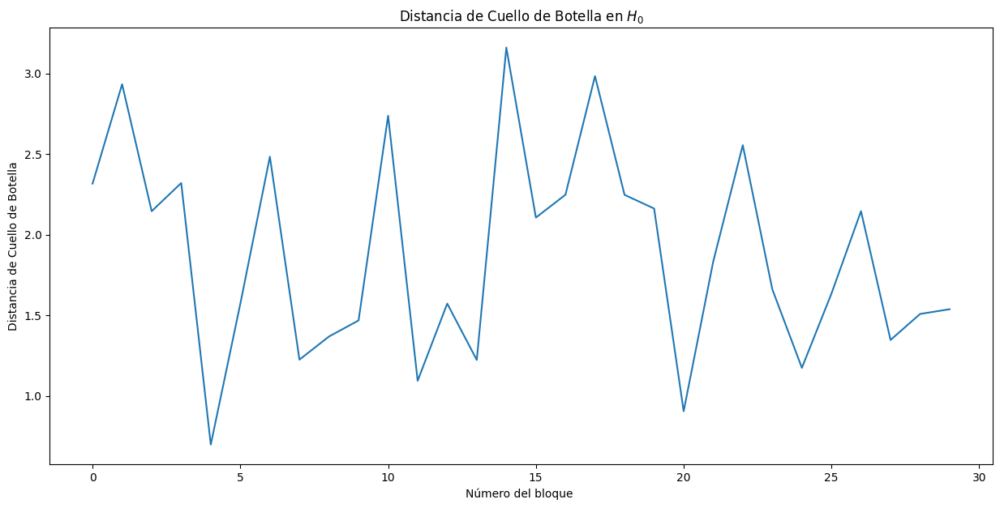

In [231]:
import numpy as np
import matplotlib.pyplot as plt
from ripser import ripser
import persim

block_size = 5

good_blocks = [good[i:i+block_size] for i in range(0, len(good), block_size)]
poor_blocks = [poor[i:i+block_size] for i in range(0, len(poor), block_size)][::-1]

bottleneck_distances = []

for good_block, poor_block in zip(good_blocks, poor_blocks):
    good_H0 = ripser(good_block[feature_names])['dgms'][0]
    poor_H0 = ripser(poor_block[feature_names])['dgms'][0]
    distance_bottleneck = persim.bottleneck(good_H0, poor_H0)
    bottleneck_distances.append(distance_bottleneck)

plt.figure(figsize=(15, 7))
plt.plot(bottleneck_distances)
plt.xlabel('Número del bloque ')
plt.ylabel('Distancia de Cuello de Botella')
plt.title('Distancia de Cuello de Botella en $H_0$')
plt.show()

### Distancia de Cuello de Botella en $H_1$

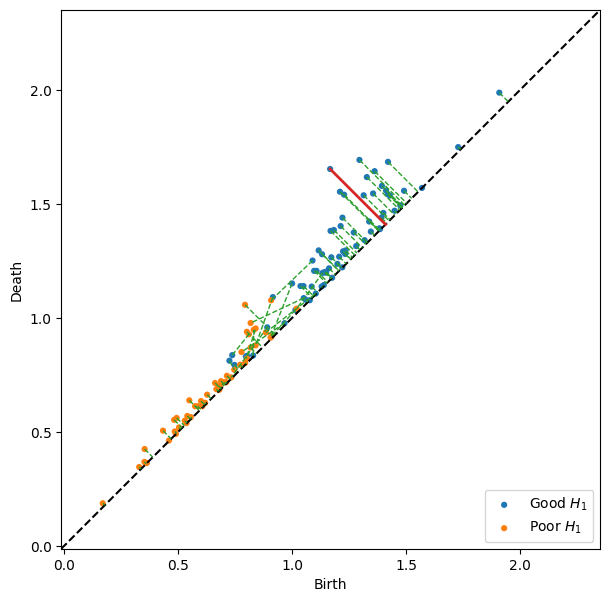

0.24300426244735718

In [222]:
good_H1 = ripser(good[feature_names])['dgms'][1]
poor_H1 = ripser(poor[feature_names])['dgms'][1]

import persim

distance_bottleneck, matching = persim.bottleneck(good_H1, poor_H1, matching=True)

plt.figure(figsize=(15, 7))
persim.bottleneck_matching(good_H1, poor_H1, matching, labels=['Good $H_1$', 'Poor $H_1$']) 
plt.show()

persim.bottleneck(good_H1, poor_H1)

En este caso, la distancia de q-Wasserstein es mucho menor a la anterior, indicando que no hay tantas diferencias topológicas entre los datos. Tambien se puede ver que los huecos en Poor $H_1$ desaparecen justo cuando los huecos de Good $H_1$ aparecen, indicando que los datos de los usuarios de Good Credit Score están más alejados que los datos de los usuarios con Poor Credit Score.

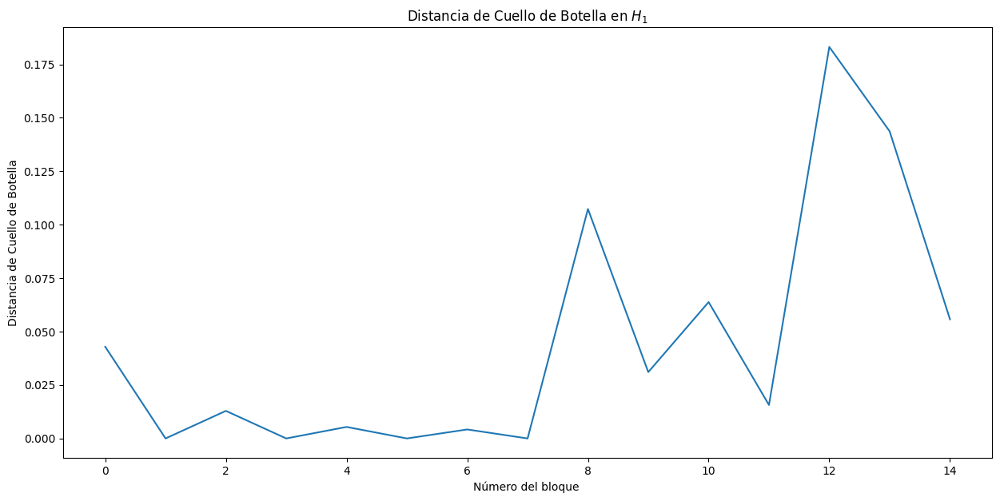

In [237]:
block_size = 10

good_blocks = [good[i:i+block_size] for i in range(0, len(good), block_size)]
poor_blocks = [poor[i:i+block_size] for i in range(0, len(poor), block_size)][::-1]

bottleneck_distances = []

for good_block, poor_block in zip(good_blocks, poor_blocks):
    good_H0 = ripser(good_block[feature_names])['dgms'][1]
    poor_H0 = ripser(poor_block[feature_names])['dgms'][1]
    distance_bottleneck = persim.bottleneck(good_H0, poor_H0)
    bottleneck_distances.append(distance_bottleneck)

plt.figure(figsize=(15, 7))
plt.plot(bottleneck_distances)
plt.xlabel('Número del bloque ')
plt.ylabel('Distancia de Cuello de Botella')
plt.title('Distancia de Cuello de Botella en $H_1$')
plt.show()

Parece que va incrementando, que es opuesto a lo que buscaba, lo que podría sugerir que entre entre más cercanos sean los grupos de datos en la clasificación de credit score más alta será la distancia de q-Wasserstein, sean sin embargo, no se puede concluir nada debido a que se utilizaron pocos datos.